<a href="https://colab.research.google.com/github/sanjayk0508/Defense-for-Adversarial-attack-MNIST/blob/main/Defense_on_Adversarial_attack_MNIST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The Detector Defense in ART

## Importing dependencies

In [2]:
!pip install adversarial-robustness-toolbox

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 27.5 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 0.17.0 requires scikit-learn>=1.2.2, but you have scikit-learn 1.1.3 which is incompatible.


In [3]:
# Importing dependencies
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten
from art.attacks.poisoning import PoisoningAttackBackdoor
from art.attacks.poisoning.perturbations import add_pattern_bd
from art.defences.detector.poison import ActivationDefence
from art.estimators.classification import KerasClassifier
from art.utils import load_dataset, to_categorical
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pprint
import json

# Disabling eager execution from TF 2
tf.compat.v1.disable_eager_execution()

# Increasing Matplotlib font size
matplotlib.rcParams.update({"font.size": 14})

## Poisoning data for the attack

In [4]:
# Loading data
(train_images_original, train_labels_original), (test_images_original, test_labels_original), min, max = load_dataset(name="mnist")

In [5]:
# Function for poisoning a given dataset
def poison_dataset(
    clean_images,
    clean_labels,
    target_labels,
    percent_poison
    ):
    # Creating copies of our clean images and labels
    # Poisoned samples will be added to these copies
    x_poison = clean_images.copy()
    y_poison = clean_labels.copy()

    # Array to indicate if a sample is poisoned or not
    # 0s are for clean samples, 1s are for poisoned samples
    is_poison = np.zeros(shape=y_poison.shape[0])

    # Indicating our source labels (as integers)
    source_labels = np.arange(10)

    # Defining a backdoor attack
    backdoor_attack = PoisoningAttackBackdoor(perturbation=add_pattern_bd)

    # Iterating over our source labels and provided target labels
    for (source_label, target_label) in (zip(source_labels, target_labels)):
        # Calculating the number of clean labels that are equal to the
        # current source label
        num_labels = np.size(np.where(np.argmax(a=clean_labels, axis=1) == source_label))

        # Calculating the number of samples that should be poisoned from
        # the current source labels
        num_poison = round(percent_poison * num_labels)

        # Getting the images for the current clean label
        source_images = clean_images[np.argmax(a=clean_labels, axis=1) == source_label]

        # Randomly picking indices to poison
        indices_to_be_poisoned = np.random.choice(
            a=num_labels,
            size=num_poison
            )

        # Get the images for the current label that should be poisoned
        images_to_be_poisoned = source_images[indices_to_be_poisoned].copy()

        # Converting the target label to a categorical
        target_label = to_categorical(labels=(np.ones(shape=num_poison) * target_label), nb_classes=10)

        # Poisoning the images and labels for the current label
        poisoned_images, poisoned_labels = backdoor_attack.poison(
            x=images_to_be_poisoned,
            y=target_label
            )

        # Appending the poisoned images to our clean images
        x_poison = np.append(
            arr=x_poison,
            values=poisoned_images,
            axis=0
            )

        # Appending the poisoned labels to our clean labels
        y_poison = np.append(
            arr=y_poison,
            values=poisoned_labels,
            axis=0
            )

        # Appending 1s to the poison indicator array
        is_poison = np.append(
            arr=is_poison,
            values=np.ones(shape=num_poison)
            )

    # Returning the poisoned samples and the poison indicator array
    return is_poison, x_poison, y_poison

In [6]:
# Defining target labels (0, 1, 2, 3 ... 0)
target_labels = (np.arange(10) + 1) % 10

# Poisoning the training data
percent_poison = .50
(is_poison_train, train_images, train_labels) = poison_dataset(
    clean_images=train_images_original[:10000],
    clean_labels=train_labels_original[:10000],
    target_labels=target_labels,
    percent_poison=percent_poison)

# Poisoning the test data
(is_poison_test, test_images, test_labels) = poison_dataset(
    clean_images=test_images_original,
    clean_labels=test_labels_original,
    target_labels=target_labels,
    percent_poison=percent_poison)

# Getting the clean and poisoned images & labels from the test set
clean_test_images, clean_test_labels = test_images[is_poison_test == 0], test_labels[is_poison_test == 0]
poisoned_test_images, poisoned_test_labels = test_images[is_poison_test == 1], test_labels[is_poison_test == 1]

# Shuffling the training data
num_train = train_images.shape[0]
shuffled_indices = np.arange(num_train)
np.random.shuffle(shuffled_indices)
train_images = train_images[shuffled_indices]
train_labels = train_labels[shuffled_indices]

## Visualizing the training data

In [7]:
# Function for creating a figure and axes
def create_figure_axes(
    nrows,
    ncols,
    figsize
    ):
    # Creating a figure and axes
    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=figsize
        )

    # Returning the figure and axes
    return fig, axes

In [8]:
# Function for plotting images
def plot_images(
    images,
    labels,
    plot_label,
    is_categorical,
    nrows,
    ncols,
    figsize
    ):
    # Creating a figure and axes
    fig, axes = create_figure_axes(
        nrows=nrows,
        ncols=ncols,
        figsize=figsize
        )

    # Defining a counting variable
    counter = 0

    # Iterating over our rows and cols,
    # plotting poisoned test images
    # along with their true targets
    for i in range(nrows):
        for j in range(ncols):
            # Converting the current label to an integer
            # if it is categorical
            if is_categorical:
                label = np.argmax(a=labels[counter])
            else:
                label = labels[counter]

            # Displaying the current image
            # and setting axis title
            axes[i, j].imshow(images[counter])
            axes[i, j].set_title(label=f"{plot_label}: {label}")

            # Disabling ticks
            axes[i, j].set_xticks(ticks=[])
            axes[i, j].set_yticks(ticks=[])

            # Incrementing the counter
            counter += 1

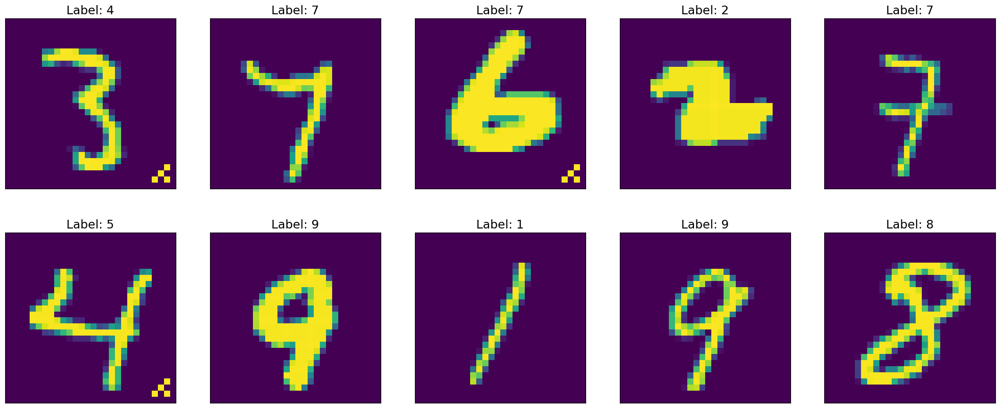

In [9]:
# Plotting ten samples of training images and their labels
plot_images(
    images=train_images,
    labels=train_labels,
    plot_label="Label",
    is_categorical=True,
    nrows=2,
    ncols=5,
    figsize=(25, 10))

## Training a model on the poisoned dataset

In [10]:
# Function for creating model
def create_model():
    # Defining the model
    model = tf.keras.models.Sequential([
        Conv2D(filters=32, kernel_size=3, activation="relu", input_shape=(28, 28, 1)),
        Conv2D(filters=64, kernel_size=3, activation="relu"),
        MaxPool2D(pool_size=2),
        Flatten(),
        Dense(units=128, activation="relu"),
        Dense(units=10, activation="softmax")
    ])

    # Compiling the model
    model.compile(
        optimizer="adam",
        loss="categorical_crossentropy",
        metrics=["accuracy"]
        )

    # Returning the model
    return model

In [11]:
# Creating and training a victim classifier
# with the poisoned data
model_poisoned = create_model()
model_poisoned.fit(
    x=train_images,
    y=train_labels,
    epochs=10
    )

Train on 15001 samples
Epoch 1/10
15001/15001 [==============================] - 39s 3ms/sample - loss: 0.5046 - accuracy: 0.8301
Epoch 2/10
15001/15001 [==============================] - 43s 3ms/sample - loss: 0.0892 - accuracy: 0.9737
Epoch 3/10
15001/15001 [==============================] - 39s 3ms/sample - loss: 0.0480 - accuracy: 0.9851
Epoch 4/10
15001/15001 [==============================] - 39s 3ms/sample - loss: 0.0229 - accuracy: 0.9926
Epoch 5/10
15001/15001 [==============================] - 37s 2ms/sample - loss: 0.0177 - accuracy: 0.9941
Epoch 6/10
15001/15001 [==============================] - 38s 3ms/sample - loss: 0.0116 - accuracy: 0.9963
Epoch 7/10
15001/15001 [==============================] - 41s 3ms/sample - loss: 0.0097 - accuracy: 0.9970
Epoch 8/10
15001/15001 [==============================] - 41s 3ms/sample - loss: 0.0130 - accuracy: 0.9960
Epoch 9/10
15001/15001 [==============================] - 39s 3ms/sample - loss: 0.0081 - accuracy: 0.9977
Epoch 10/10
15

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


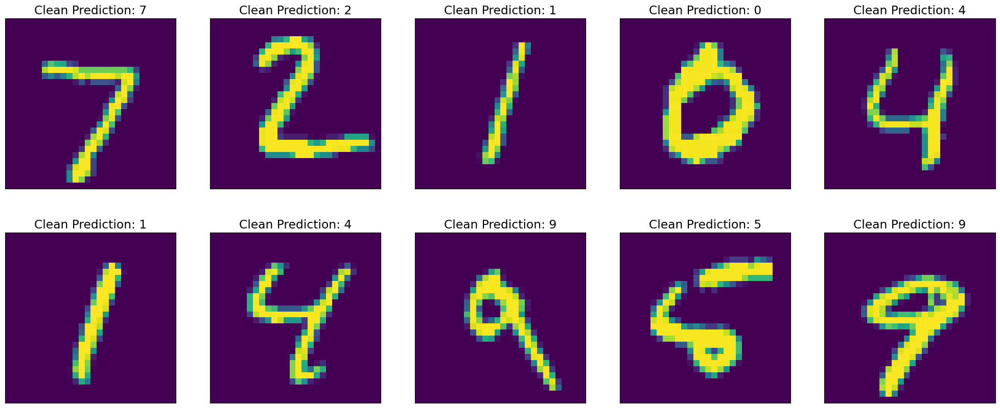

In [12]:
# Getting predictions for the selected images
clean_predictions = model_poisoned.predict(x=clean_test_images)

# Plotting clean test images and their predictions
plot_images(
    images=clean_test_images,
    labels=clean_predictions,
    plot_label="Clean Prediction",
    is_categorical=True,
    nrows=2,
    ncols=5,
    figsize=(25, 10)
);

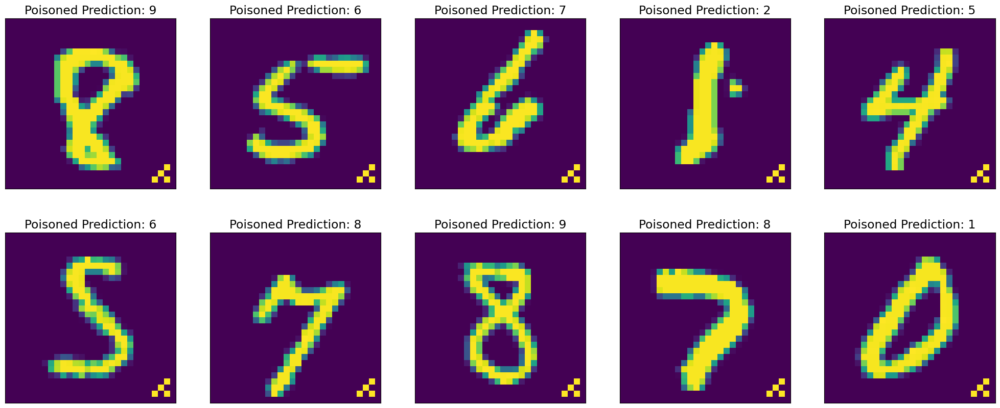

In [13]:
# Getting random ten images from the poisoned test set
num_samples = 10
sample_indices = np.random.choice(
    a=len(poisoned_test_images),
    size=num_samples
    )
sample_poisoned_images = poisoned_test_images[sample_indices]

# Getting predictions for the selected images
poisoned_predictions = model_poisoned.predict(x=sample_poisoned_images)

# Plotting poisoned test images and their predictions
plot_images(
    images=sample_poisoned_images,
    labels=poisoned_predictions,
    plot_label="Poisoned Prediction",
    is_categorical=True,
    nrows=2,
    ncols=5,
    figsize=(25, 10)
)

In [14]:
# Evaluating the performance of the vulnerable classifier on clean and poisoned samples
score_clean = model_poisoned.evaluate(x=clean_test_images, y=clean_test_labels)
score_poisoned = model_poisoned.evaluate(x=poisoned_test_images, y=poisoned_test_labels)

# Comparing test losses
print("------ TEST METRICS OF POISONED MODEL ------")
print(f"Test loss on clean data: {score_clean[0]:.2f} "
      f"vs test loss on poisoned data: {score_poisoned[0]:.2f}")

# Comparing test losses
print(f"Test accuracy on clean data: {score_clean[1]:.2f} "
      f"vs test accuracy on poisoned data: {score_poisoned[1]:.2f}")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


------ TEST METRICS OF POISONED MODEL ------
Test loss on clean data: 0.10 vs test loss on poisoned data: 0.20
Test accuracy on clean data: 0.98 vs test accuracy on poisoned data: 0.96


## Building a detector defense for the poisoning attack

In [15]:
# Wrapping our model in KerasClassifier
classifier_poisoned = KerasClassifier(
    model=model_poisoned,
    clip_values=(min, max)
)

# Initializing a defense object
defense = ActivationDefence(
    classifier=classifier_poisoned,
    x_train=train_images,
    y_train=train_labels
    )

In [16]:
# Detecting poisoned samples in the provided images
report, is_clean_reported = defense.detect_poison(
    nb_clusters=2,
    reduce="PCA",
    nb_dims=10)

In [17]:
# Inspecting the report
pprint.pprint(report)

{'Class_0': {'cluster_0': {'ptc_data_in_cluster': 0.67,
                           'suspicious_cluster': False},
             'cluster_1': {'ptc_data_in_cluster': 0.33,
                           'suspicious_cluster': True}},
 'Class_1': {'cluster_0': {'ptc_data_in_cluster': 0.69,
                           'suspicious_cluster': False},
             'cluster_1': {'ptc_data_in_cluster': 0.31,
                           'suspicious_cluster': True}},
 'Class_2': {'cluster_0': {'ptc_data_in_cluster': 0.64,
                           'suspicious_cluster': False},
             'cluster_1': {'ptc_data_in_cluster': 0.36,
                           'suspicious_cluster': True}},
 'Class_3': {'cluster_0': {'ptc_data_in_cluster': 0.32,
                           'suspicious_cluster': True},
             'cluster_1': {'ptc_data_in_cluster': 0.68,
                           'suspicious_cluster': False}},
 'Class_4': {'cluster_0': {'ptc_data_in_cluster': 0.34,
                           'suspicious_c

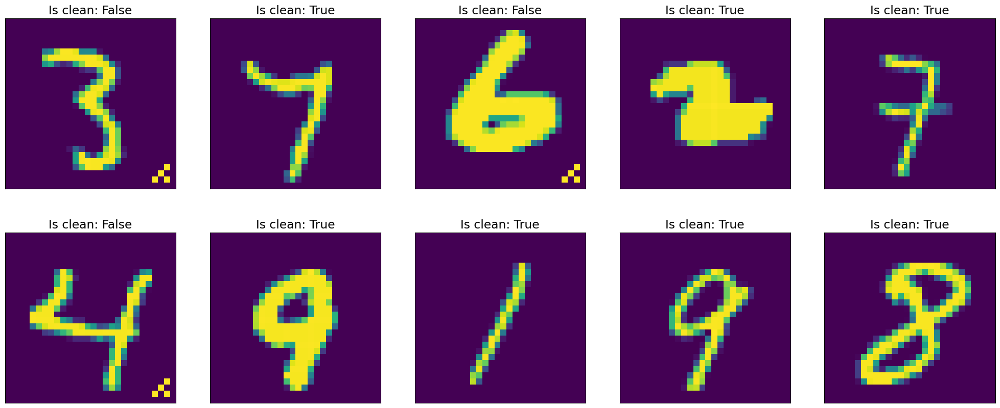

In [18]:
# Plotting ten samples of training images and their labels
plot_images(
    images=train_images,
    labels=np.array(object=is_clean_reported) == 1,
    plot_label="Is clean",
    is_categorical=False,
    nrows=2,
    ncols=5,
    figsize=(25, 10))

In [19]:
# Reversing our poison indicator array
# so that clean samples are indicated as 1s
# and poisoned samples as 0s
is_clean = (is_poison_train == 0)

# Generating a confusion matrix to evaluate defenses
confusion_matrix = defense.evaluate_defence(is_clean=is_clean[shuffled_indices])

# Displaying the reported defense effectiveness
jsonObject = json.loads(s=confusion_matrix)
for label in jsonObject:
    print(label)
    pprint.pprint(jsonObject[label])

class_0
{'FalseNegative': {'denominator': 489, 'numerator': 1, 'rate': 0.2},
 'FalsePositive': {'denominator': 1001, 'numerator': 0, 'rate': 0.0},
 'TrueNegative': {'denominator': 1001, 'numerator': 1001, 'rate': 100.0},
 'TruePositive': {'denominator': 489, 'numerator': 488, 'rate': 99.8}}
class_1
{'FalseNegative': {'denominator': 500, 'numerator': 0, 'rate': 0.0},
 'FalsePositive': {'denominator': 1127, 'numerator': 0, 'rate': 0.0},
 'TrueNegative': {'denominator': 1127, 'numerator': 1127, 'rate': 100.0},
 'TruePositive': {'denominator': 500, 'numerator': 500, 'rate': 100.0}}
class_2
{'FalseNegative': {'denominator': 564, 'numerator': 0, 'rate': 0.0},
 'FalsePositive': {'denominator': 991, 'numerator': 0, 'rate': 0.0},
 'TrueNegative': {'denominator': 991, 'numerator': 991, 'rate': 100.0},
 'TruePositive': {'denominator': 564, 'numerator': 564, 'rate': 100.0}}
class_3
{'FalseNegative': {'denominator': 496, 'numerator': 0, 'rate': 0.0},
 'FalsePositive': {'denominator': 1032, 'numerat

## Visualizing the Detected Clusters

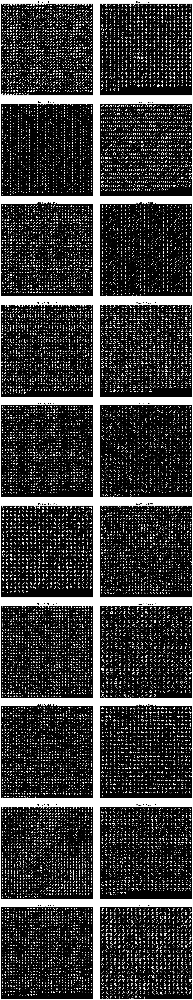

In [20]:
# Getting the visualizations for our clusters
sprites_by_class = defense.visualize_clusters(
    x_raw=train_images,
    save=False
    )

# Creating a plot figure and axes for the clusters
fig, axes = create_figure_axes(
    nrows=10,
    ncols=2,
    figsize=(20, 100)
    )

# Maximizing the use of space in the figure
plt.tight_layout()

# Visualizing the clusters for each class
for i in range(10):
    for j in range(2):
        axes[i, j].imshow(sprites_by_class[i][j])
        axes[i, j].set_xticks(ticks=[])
        axes[i, j].set_yticks(ticks=[])
        axes[i, j].set_title(label=f"Class {i}, Cluster {j}")


# The Transformer Defense in ART

## Poisoning data and training a model

In [21]:
# Importing the transformer class
from art.defences.transformer.poisoning import STRIP

# Defining new target labels (all 9s)
target_labels = np.array([9] * 10)

# Poisoning training data
percent_poison = .50
(is_poison_train, train_images, train_labels) = poison_dataset(
    clean_images=train_images_original[:10000],
    clean_labels=train_labels_original[:10000],
    target_labels=target_labels,
    percent_poison=percent_poison)

# Poisoning test data
(is_poison_test, test_images, test_labels) = poison_dataset(
    clean_images=test_images_original,
    clean_labels=test_labels_original,
    target_labels=target_labels,
    percent_poison=percent_poison)

# Separating out clean and poisoned samples from the test set
clean_test_images, clean_test_labels = test_images[is_poison_test == 0], test_labels[is_poison_test == 0]
poisoned_test_images, poisoned_test_labels = test_images[is_poison_test == 1], test_labels[is_poison_test == 1]

# Shuffling training data
num_train = train_images.shape[0]
shuffled_indices = np.arange(num_train)
np.random.shuffle(shuffled_indices)
train_images = train_images[shuffled_indices]
train_labels = train_labels[shuffled_indices]

In [22]:
# Creating and training a victim classifier
# with the poisoned data
model_poisoned = create_model()
model_poisoned.fit(
    x=train_images,
    y=train_labels,
    epochs=10
    )

Train on 15001 samples
Epoch 1/10
15001/15001 [==============================] - 48s 3ms/sample - loss: 0.2260 - accuracy: 0.9288
Epoch 2/10
15001/15001 [==============================] - 39s 3ms/sample - loss: 0.0524 - accuracy: 0.9826
Epoch 3/10
15001/15001 [==============================] - 40s 3ms/sample - loss: 0.0284 - accuracy: 0.9910
Epoch 4/10
15001/15001 [==============================] - 39s 3ms/sample - loss: 0.0159 - accuracy: 0.9950
Epoch 5/10
15001/15001 [==============================] - 38s 3ms/sample - loss: 0.0068 - accuracy: 0.9982
Epoch 6/10
15001/15001 [==============================] - 39s 3ms/sample - loss: 0.0099 - accuracy: 0.9967
Epoch 7/10
15001/15001 [==============================] - 39s 3ms/sample - loss: 0.0089 - accuracy: 0.9970
Epoch 8/10
15001/15001 [==============================] - 38s 3ms/sample - loss: 0.0056 - accuracy: 0.9983
Epoch 9/10
15001/15001 [==============================] - 39s 3ms/sample - loss: 0.0027 - accuracy: 0.9997
Epoch 10/10
15

In [23]:
# Evaluating the performance of the vulnerable classifier on clean and poisoned images
score_clean = model_poisoned.evaluate(x=clean_test_images, y=clean_test_labels)
score_poisoned = model_poisoned.evaluate(x=poisoned_test_images, y=poisoned_test_labels)

# Comparing test losses
print("------ TEST METRICS OF POISONED MODEL ------")
print(f"Test loss on clean data: {score_clean[0]:.2f} "
      f"vs test loss on poisoned data: {score_poisoned[0]:.2f}")

# Comparing test losses
print(f"Test accuracy on clean data: {score_clean[1]:.2f} "
      f"vs test accuracy on poisoned data: {score_poisoned[1]:.2f}")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


------ TEST METRICS OF POISONED MODEL ------
Test loss on clean data: 0.09 vs test loss on poisoned data: 0.00
Test accuracy on clean data: 0.98 vs test accuracy on poisoned data: 1.00


In [24]:
# Wrapping the model in KerasClassifier
classifier_poisoned = KerasClassifier(
    model=model_poisoned,
    clip_values=(min, max)
    )

## Detecting poisoned samples

In [25]:
# Initializing the defense object
strip = STRIP(classifier=classifier_poisoned)

# Creating a STRIP defense
defense = strip()

# Mitigating the effect of the poison
defense.mitigate(x_val=clean_test_images[:5000])

  0%|          | 0/5000 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


In [26]:
# Obtaining predictions for clean and poisoned samples
poison_preds = defense.predict(x=poisoned_test_images)
clean_preds = defense.predict(x=clean_test_images[5000:])

In [27]:
# Getting the number of predictions that have been abstained
num_abstained_poison = np.sum(np.all(a=(poison_preds == np.zeros(10)), axis=1))
num_abstained_clean = np.sum(np.all(a=(clean_preds == np.zeros(10)), axis=1))

# Getting the total number of poisoned and clean predictions
num_poison = len(poison_preds)
num_clean = len(clean_preds)

In [28]:
# Calculating and displaying the ratio of abstained samples
print(f"Abstained {num_abstained_poison}/{num_poison} poison samples ({round(num_abstained_poison / float(num_poison)* 100, 2)}% TP rate)")
print(f"Abstained {num_abstained_clean}/{num_clean} clean samples ({round(num_abstained_clean / float(num_clean) * 100, 2)}% FP rate)")

Abstained 364/5000 poison samples (7.28% TP rate)
Abstained 27/5000 clean samples (0.54% FP rate)


# The Trainer Defense in ART

## Training vulnerable and robust models

In [29]:
# Importing dependencies
from art.defences.trainer import AdversarialTrainer
from art.attacks.evasion import FastGradientMethod

# Initializing a vulnerable classsifier
vulnerable_classifier = KerasClassifier(
    model=create_model(),
    clip_values=(min, max)
    )

# Initializing a robust classifier
robust_classifier = KerasClassifier(
    model=create_model(),
    clip_values=(min, max)
    )

In [30]:
# Training the vulnerable classifier
vulnerable_classifier.fit(
    x=train_images_original[:10000],
    y=train_labels_original[:10000],
    nb_epochs=10
    )

In [31]:
# Initializing a Fast Gradient Method attack
attack_fgm = FastGradientMethod(
    estimator=vulnerable_classifier,
    eps=0.15
    )

In [32]:
# Initializing an adversarial trainer to train
# a robust model
trainer = AdversarialTrainer(
    classifier=robust_classifier,
    attacks=attack_fgm,
    ratio=0.5
    )

In [33]:
# Training the robust classifier
trainer.fit(
    x=train_images_original[:10000],
    y=train_labels_original[:10000],
    nb_epochs=10
    )

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/10 [00:00<?, ?it/s]

## Evaluating the effectiveness of the trainer

In [34]:
# Generating adversarial samples
test_images_fgm = attack_fgm.generate(x=test_images_original)

In [35]:
# Evaluating the performance of the vulnerable classier on clean and adversarial images
score_clean = vulnerable_classifier._model.evaluate(x=test_images_original, y=test_labels_original)
score_fgm = vulnerable_classifier._model.evaluate(x=test_images_fgm, y=test_labels_original)

# Comparing test losses
print("------ TEST METRICS OF VULNERABLE MODEL ------")
print(f"Clean test loss: {score_clean[0]:.2f} "
      f"vs FGM test loss: {score_fgm[0]:.2f}")

# Comparing test accuracies
print(f"Clean test accuracy: {score_clean[1]:.2f} "
      f"vs FGM test accuracy: {score_fgm[1]:.2f}")

------ TEST METRICS OF VULNERABLE MODEL ------
Clean test loss: 0.08 vs FGM test loss: 2.98
Clean test accuracy: 0.98 vs FGM test accuracy: 0.47


In [36]:
# Evaluating the performance of the robust classifier on adversarial images
score_robust_fgm = robust_classifier._model.evaluate(x=test_images_fgm, y=test_labels_original)

# Comparing test losses
print("------ TEST METRICS OF ROBUST VS VULNERABLE MODEL ON ADVERSARIAL SAMPLES ------")
print(f"Robust model test loss: {score_robust_fgm[0]:.2f} "
      f"vs model vulnerable test loss: {score_fgm[0]:.2f}")

# Comparing test accuracies
print(f"Robust model test accuracy: {score_robust_fgm[1]:.2f} "
      f"vs model vulnerable test accuracy: {score_fgm[1]:.2f}")

------ TEST METRICS OF ROBUST VS VULNERABLE MODEL ON ADVERSARIAL SAMPLES ------
Robust model test loss: 0.16 vs model vulnerable test loss: 2.98
Robust model test accuracy: 0.98 vs model vulnerable test accuracy: 0.47


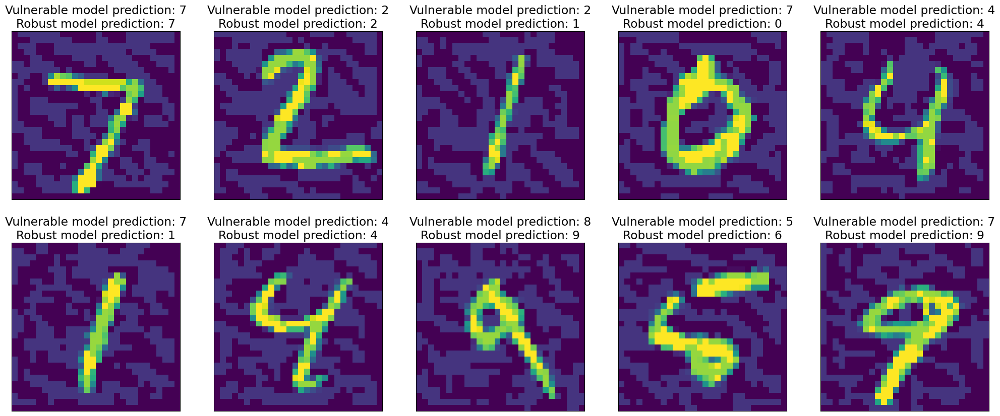

In [37]:
# Setting the number of rows and columns for the plot
nrows=2
ncols=5

# Creating a plot figure and axes for samples
fig, axes = create_figure_axes(
    nrows=nrows,
    ncols=ncols,
    figsize=(25, 10)
    )

# Getting predictions for adversarial samples
victim_predictions = vulnerable_classifier.predict(x=test_images_fgm)
robust_predictions = robust_classifier.predict(x=test_images_fgm)

# Defining a counting variable
counter = 0

# Iterating over rows and cols,
# plotting adversarial images
# along with their predictions
for i in range(nrows):
    for j in range(ncols):
        # Plotting the current image
        axes[i, j].imshow(test_images_fgm[counter])

        # Setting axis title
        axes[i, j].set_title(label=f"Vulnerable model prediction: {np.argmax(victim_predictions[counter])}\n"
                                   f"Robust model prediction: {np.argmax(robust_predictions[counter])}")

        # Disabling axis ticks
        axes[i, j].set_xticks(ticks=[])
        axes[i, j].set_yticks(ticks=[])

        # Incrementing the counter
        counter += 1

# The Preprocessor Defense in ART

## Setting up the defense

In [38]:
# Importing dependencies
from art.defences.preprocessor import TotalVarMin

# Initializing the defense
defense = TotalVarMin(
    norm=1
)

# Running the defense on adversarial images
test_images_fgm_cleaned = defense(test_images_fgm[:1000])[0]

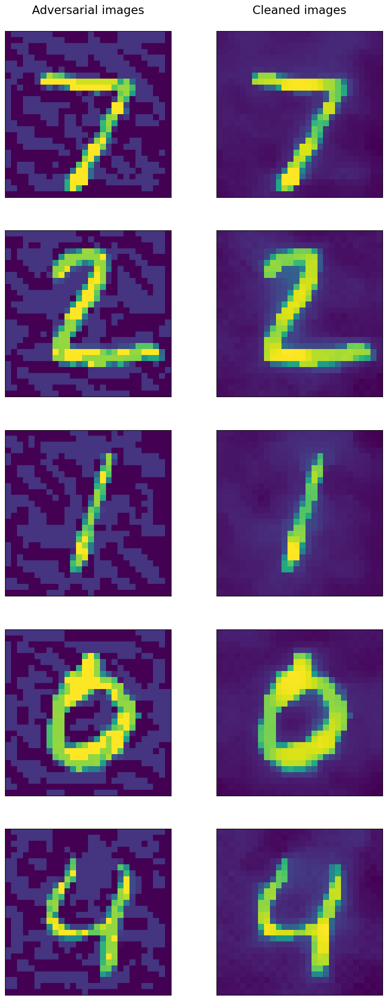

In [39]:
# Defining a number of rows and columns for the plot
nrows, ncols = 5, 2

# Creating a plot figure and axes for the samples
fig, axes = create_figure_axes(
    nrows=nrows,
    ncols=ncols,
    figsize=(10, 25)
    )

# Defining a counting variable
counter = 0

# Indicating the purpose of each column
axes[0, 0].set_title(
        label="Adversarial images",
        pad=25
        )
axes[0, 1].set_title(
        label="Cleaned images",
        pad=25
        )

# Iterating over the axis rows in our figure
for i in range(nrows):
        # Plotting the adversarial image,
        # turning off axis ticks,
        # and setting the axis title
        axes[i, 0].imshow(test_images_fgm[counter])
        axes[i, 0].set_xticks(ticks=[])
        axes[i, 0].set_yticks(ticks=[])


        # Plotting the cleaned image,
        # turning off axis ticks,
        # and setting the axis title
        axes[i, 1].imshow(test_images_fgm_cleaned[counter])
        axes[i, 1].set_xticks(ticks=[])
        axes[i, 1].set_yticks(ticks=[])


        # Incrementing counter value
        counter += 1

# Showing the plot
plt.show()

## Evaluating the preprocessor defense

In [40]:
# Evaluating the performance of the vulnerable classifier on adversarial and cleaned images
score_fgm = vulnerable_classifier._model.evaluate(x=test_images_fgm[:1000], y=test_labels_original[:1000])
score_fgm_cleaned = vulnerable_classifier._model.evaluate(x=test_images_fgm_cleaned, y=test_labels_original[:1000])

# Comparing test losses
print("------ TEST METRICS ON ADVERSARIAL AND CLEANED IMAGES ------")
print(f"Test loss on adversarial images: {score_fgm[0]:.2f} "
      f"vs test loss on cleaned images: {score_fgm_cleaned[0]:.2f}")

# Comparing test accuracies
print(f"Test accuracy on adversarial images: {score_fgm[1]:.2f} "
      f"vs test accuracy on cleaned images: {score_fgm_cleaned[1]:.2f}")

------ TEST METRICS ON ADVERSARIAL AND CLEANED IMAGES ------
Test loss on adversarial images: 3.20 vs test loss on cleaned images: 0.64
Test accuracy on adversarial images: 0.41 vs test accuracy on cleaned images: 0.79


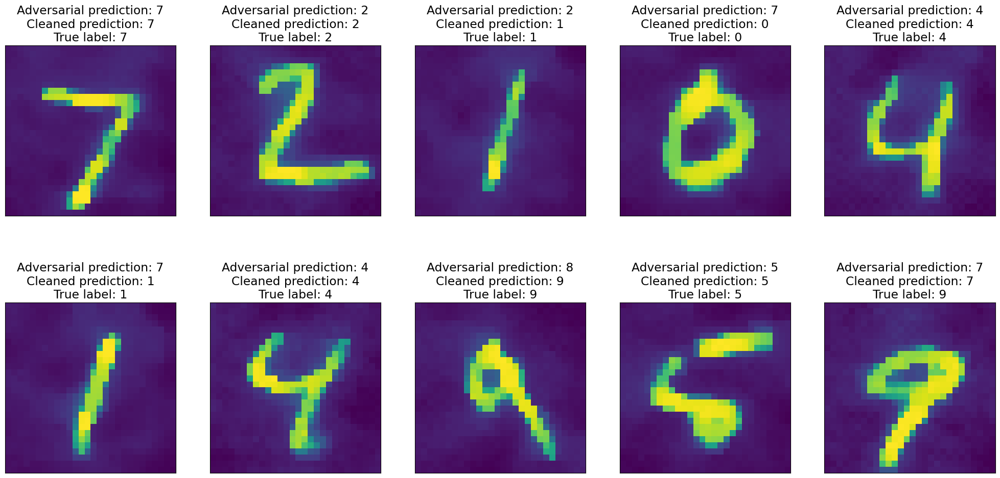

In [41]:
# Setting the number of rows and columns for the plot
nrows, ncols = 2, 5

# Creating a plot figure and axes for the samples
fig, axes = create_figure_axes(
    nrows=nrows,
    ncols=ncols,
    figsize=(25, 12)
    )

fgm_predictions = vulnerable_classifier.predict(x=test_images_fgm)
fgm_clean_predictions = vulnerable_classifier.predict(x=test_images_fgm_cleaned)

# Defining a counting variable
counter = 0

# Iterating over rows and cols,
# plotting adversarial samples
# along with their predictions
for i in range(nrows):
    for j in range(ncols):
        # Plotting the current cleaned image
        axes[i, j].imshow(test_images_fgm_cleaned[counter])

        # Displaying predictions along with the true label
        axes[i, j].set_title(label=f"Adversarial prediction: {np.argmax(fgm_predictions[counter])}\n"
                                   f"Cleaned prediction: {np.argmax(fgm_clean_predictions[counter])}\n"
                                   f"True label: {np.argmax(test_labels_original[counter])}")

        # Disabling ticks for the axis
        axes[i, j].set_xticks(ticks=[])
        axes[i, j].set_yticks(ticks=[])

        # Incrementing the counter
        counter += 1

# The Postprocessor Defense in ART

## Training a victim model

In [42]:
# Importing dependencies
from art.defences.postprocessor import ReverseSigmoid
from art.attacks.extraction import CopycatCNN

# Setting aside a subset of the source dataset for the original model
train_images_victim = train_images_original[:50000]
train_labels_victim = train_labels_original[:50000]

# Using the rest of the source dataset for the stolen model
train_images_stolen = train_images_original[50000:]
train_labels_stolen = train_labels_original[50000:]

In [43]:
# Creating and training a  classifier
# with the original clean data
model = create_model()
model.fit(
    x=train_images_victim,
    y=train_labels_victim,
    epochs=10
    )

Train on 50000 samples
Epoch 1/10
50000/50000 [==============================] - 135s 3ms/sample - loss: 0.1217 - accuracy: 0.9629
Epoch 2/10
50000/50000 [==============================] - 139s 3ms/sample - loss: 0.0404 - accuracy: 0.9868
Epoch 3/10
50000/50000 [==============================] - 134s 3ms/sample - loss: 0.0235 - accuracy: 0.9927
Epoch 4/10
50000/50000 [==============================] - 137s 3ms/sample - loss: 0.0177 - accuracy: 0.9936
Epoch 5/10
50000/50000 [==============================] - 125s 2ms/sample - loss: 0.0117 - accuracy: 0.9961
Epoch 6/10
50000/50000 [==============================] - 126s 3ms/sample - loss: 0.0097 - accuracy: 0.9967
Epoch 7/10
50000/50000 [==============================] - 128s 3ms/sample - loss: 0.0070 - accuracy: 0.9976
Epoch 8/10
50000/50000 [==============================] - 133s 3ms/sample - loss: 0.0078 - accuracy: 0.9973
Epoch 9/10
50000/50000 [==============================] - 131s 3ms/sample - loss: 0.0050 - accuracy: 0.9982
Epoch

## Setting up a postprocessing defense

In [44]:
# Initializing the postprocessor
postprocessor = ReverseSigmoid(
    beta=1.0,
    gamma=0.2
    )

# Creating an instance of an unprotected classifier
unprotected_classifier = KerasClassifier(
    model=model,
    clip_values=(min, max))

# Creating an instance of a protected classifier
protected_classifier = KerasClassifier(
    model=model,
    clip_values=(min, max),
    postprocessing_defences=postprocessor)

In [45]:
# Getting predictions for the unprotected model
unprotected_predictions = unprotected_classifier.predict(x=test_images_original[:10])

# Inspecting unprotected predictions
print("----- ONE-HOT PREDICTIONS -----", "\n", unprotected_predictions, "\n")
print("----- CLASS PREDICTIONS -----", "\n", np.argmax(a=unprotected_predictions, axis=1))

----- ONE-HOT PREDICTIONS ----- 
 [[7.49164194e-19 3.82964771e-16 8.79395059e-16 1.03044743e-11
  2.74503148e-22 7.13294651e-17 3.56490869e-20 9.99999940e-01
  1.27458093e-17 6.56578542e-11]
 [6.44189269e-17 3.22397100e-12 9.99999940e-01 2.07146188e-18
  2.99966451e-20 3.06580097e-28 1.03119825e-19 3.88722663e-16
  2.67016507e-21 4.69441334e-19]
 [2.39577080e-10 9.99999583e-01 1.35150946e-10 1.17689053e-11
  1.37759146e-08 5.36522382e-09 1.38885419e-08 1.49917878e-09
  3.82180872e-07 5.16869290e-11]
 [9.99999940e-01 1.91938208e-13 3.41506554e-12 2.45721568e-11
  4.79425983e-18 2.72871393e-14 2.93094412e-12 2.75309235e-13
  4.48790895e-18 7.78762837e-14]
 [2.12694056e-14 1.21314823e-13 1.49589212e-08 1.58321370e-12
  9.99999702e-01 9.72708676e-13 2.40939755e-12 3.07015996e-13
  1.12150560e-10 2.89234322e-07]
 [5.03519899e-11 9.99999702e-01 4.39754760e-10 4.32440542e-12
  4.25222346e-09 2.41940218e-10 2.67115247e-10 6.27277714e-08
  1.02484741e-07 2.79925666e-11]
 [1.71089128e-16 2.66557

In [46]:
# Getting predictions for the protected model
protected_predictions = protected_classifier.predict(x=test_images_original[:10])

# Inspecting protected predictions
print("----- ONE-HOT PREDICTIONS -----", "\n", protected_predictions, "\n")
print("----- CLASS PREDICTIONS -----", "\n", np.argmax(a=protected_predictions, axis=1))

----- ONE-HOT PREDICTIONS ----- 
 [[0.09897319 0.09897319 0.09897319 0.09897319 0.09897319 0.09897319
  0.09897319 0.10924127 0.09897319 0.09897319]
 [0.09897319 0.09897319 0.10924127 0.09897319 0.09897319 0.09897319
  0.09897319 0.09897319 0.09897319 0.09897319]
 [0.09992483 0.11352149 0.09992483 0.09992483 0.09776281 0.09866754
  0.09775427 0.09965794 0.0929366  0.09992483]
 [0.10924127 0.09897319 0.09897319 0.09897319 0.09897319 0.09897319
  0.09897319 0.09897319 0.09897319 0.09897319]
 [0.09957717 0.09957717 0.09733596 0.09957717 0.11248523 0.09957717
  0.09957717 0.09957717 0.09957717 0.0931387 ]
 [0.09968304 0.11260483 0.09968304 0.09968304 0.09862744 0.09968304
  0.09968304 0.0956919  0.09497753 0.09968304]
 [0.1026207  0.09964367 0.1026207  0.1026207  0.1561141  0.09727504
  0.1026207  0.10038471 0.0558527  0.08024696]
 [0.0989732  0.0989732  0.0989732  0.0989732  0.0989732  0.0989732
  0.0989732  0.0989732  0.0989732  0.10924128]
 [0.10029784 0.10029784 0.10029784 0.10029784 0

In [47]:
# Making sure that the sum of probabilities of all classes is 1
print(np.sum(a=protected_predictions, axis=1))

[1.        1.        1.        1.        1.0000001 0.9999999 1.
 1.0000001 1.        1.0000001]


## Building and training CopycatCNNs

In [48]:
# Initializing the models that will be trained by the model extractor
model_stolen_unprotected = KerasClassifier(model=create_model(), clip_values=(min, max))
model_stolen_protected = KerasClassifier(model=create_model(), clip_values=(min, max))

In [49]:
# Creating the "neural net thief" object
# that will try to steal the unprotected classifier
copycat_cnn_unprotected = CopycatCNN(
    batch_size_fit=256,
    batch_size_query=256,
    nb_epochs=10,
    nb_stolen=len(train_images_stolen),
    classifier=unprotected_classifier
    )

# Creating the "neural net thief" object
# that will try to steal the protected classifier
copycat_cnn_protected = CopycatCNN(
    batch_size_fit=256,
    batch_size_query=256,
    nb_epochs=10,
    nb_stolen=len(train_images_stolen),
    classifier=protected_classifier
    )

In [50]:
# Extracting the unprotected model
classifier_stolen_unprotected = copycat_cnn_unprotected.extract(
    x=train_images_stolen,
    y=train_labels_stolen,
    thieved_classifier=model_stolen_unprotected
    )

In [51]:
# Extracting the protected model
classifier_stolen_protected = copycat_cnn_protected.extract(
    x=train_images_stolen,
    y=train_labels_stolen,
    thieved_classifier=model_stolen_protected
    )

In [52]:
# Evaluating the performance of the victim model and the stolen models
score_victim = unprotected_classifier._model.evaluate(x=test_images_original, y=test_labels_original)
score_stolen_unprotected = classifier_stolen_unprotected._model.evaluate(x=test_images_original, y=test_labels_original)
score_stolen_protected = classifier_stolen_protected._model.evaluate(x=test_images_original, y=test_labels_original)

# Comparing test losses
print("------ TEST METRICS, ORIGINAL VS STOLEN MODELS ------\n\n")
print("------ TEST LOSS ------\n")
print(f"Original model: {score_victim[0]:.2f}\n"
      f"Stolen unprotected model: {score_stolen_unprotected[0]:.2f}\n"
      f"Stolen protected model: {score_stolen_protected[0]:.2f}\n")

# Comparing test accuracies
print("------ TEST ACCURACY ------\n")
print(f"Original model: {score_victim[1]:.2f}\n"
      f"Stolen unprotected model: {score_stolen_unprotected[1]:.2f}\n"
      f"Stolen protected model: {score_stolen_protected[1]:.2f}\n")

------ TEST METRICS, ORIGINAL VS STOLEN MODELS ------


------ TEST LOSS ------

Original model: 0.05
Stolen unprotected model: 0.09
Stolen protected model: 0.08

------ TEST ACCURACY ------

Original model: 0.99
Stolen unprotected model: 0.97
Stolen protected model: 0.98



## Building and training probabilistic CopycatCNNs

In [53]:
# Creating the probabilistic "neural net thief" object
# that will try to steal the unprotected classifier
copycat_cnn_unprotected_probabilistic = CopycatCNN(
    batch_size_fit=256,
    batch_size_query=256,
    nb_epochs=10,
    nb_stolen=len(train_images_stolen),
    use_probability=True,
    classifier=unprotected_classifier
    )

# Creating the probabilistic "neural net thief" object
# that will try to steal the protected classifier
copycat_cnn_protected_probabilistic = CopycatCNN(
    batch_size_fit=256,
    batch_size_query=256,
    nb_epochs=10,
    nb_stolen=len(train_images_stolen),
    use_probability=True,
    classifier=protected_classifier
    )

# Reinitializing the models that will be trained by the model extractor
model_stolen_unprotected = KerasClassifier(model=create_model(), clip_values=(min, max))
model_stolen_protected = KerasClassifier(model=create_model(), clip_values=(min, max))

In [54]:
# Extracting the unprotected model
classifier_stolen_unprotected_probabilistic = copycat_cnn_unprotected_probabilistic.extract(
    x=train_images_stolen,
    y=train_labels_stolen,
    thieved_classifier=model_stolen_unprotected
    )

In [55]:
# Extracting the protected classifier
classifier_stolen_protected_probabilistic = copycat_cnn_protected_probabilistic.extract(
    x=train_images_stolen,
    y=train_labels_stolen,
    thieved_classifier=model_stolen_protected
    )

In [56]:
# Evaluating the performance of the victim model and the stolen models
score_stolen_unprotected_probabilistic = classifier_stolen_unprotected_probabilistic._model.evaluate(x=test_images_original, y=test_labels_original)
score_stolen_protected_probabilistic = classifier_stolen_protected_probabilistic._model.evaluate(x=test_images_original, y=test_labels_original)

# Comparing test losses
print("------ TEST METRICS, ORIGINAL VS PROBABILISTIC STOLEN MODELS ------\n\n")
print("------ TEST LOSS ------\n")
print(f"Original model: {score_victim[0]:.2f}\n"
      f"Stolen unprotected model: {score_stolen_unprotected_probabilistic[0]:.2f}\n"
      f"Stolen protected model: {score_stolen_protected_probabilistic[0]:.2f}\n")

# Comparing test accuracies
print("------ TEST ACCURACY ------\n")
print(f"Original model: {score_victim[1]:.2f}\n"
      f"Stolen unprotected model: {score_stolen_unprotected_probabilistic[1]:.2f}\n"
      f"Stolen protected model: {score_stolen_protected_probabilistic[1]:.2f}\n")

------ TEST METRICS, ORIGINAL VS PROBABILISTIC STOLEN MODELS ------


------ TEST LOSS ------

Original model: 0.05
Stolen unprotected model: 0.07
Stolen protected model: 2.21

------ TEST ACCURACY ------

Original model: 0.99
Stolen unprotected model: 0.98
Stolen protected model: 0.92

